# HCMLD'21 Week1 Exploratory Data Analysis Exercise
Diabetes is a chronic condition in which the body develops a resistance to insulin, a hormone which converts food into glucose. Diabetes affect many people worldwide and is normally divided into Type 1 and Type 2 diabetes. Both have different characteristics. The dataset can be found on the Kaggle website. This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases and can be used to predict whether a patient has diabetes based on certain diagnostic factors. 

In [18]:
# Import packages
from matplotlib import pyplot
from pandas import read_csv
from pandas import set_option
import numpy
from scipy.stats import shapiro
import seaborn as sns

# Increase the plot size
pyplot.rcParams['figure.dpi'] = 100 

In [19]:
# Import data from URL.
url = 'https://raw.githubusercontent.com/klee141/hcmld21/main/Datasets/pima-indians-diabetes.csv'

In [7]:
# This is how you can install pacakges in Google CoLab. Don't need to run twice
!pip install pandas-profiling==2.7.1

In [20]:
# Define column names
names = ['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age','Outcome']
data = read_csv(url, names=names)

#EDA using Pandas Profiling
from pandas_profiling import ProfileReport
profile = ProfileReport(data)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/21 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
# Checking Raw Dataframe
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [22]:
# Adjusting Plot Size
pyplot.rcParams['figure.figsize'] = [20, 20]

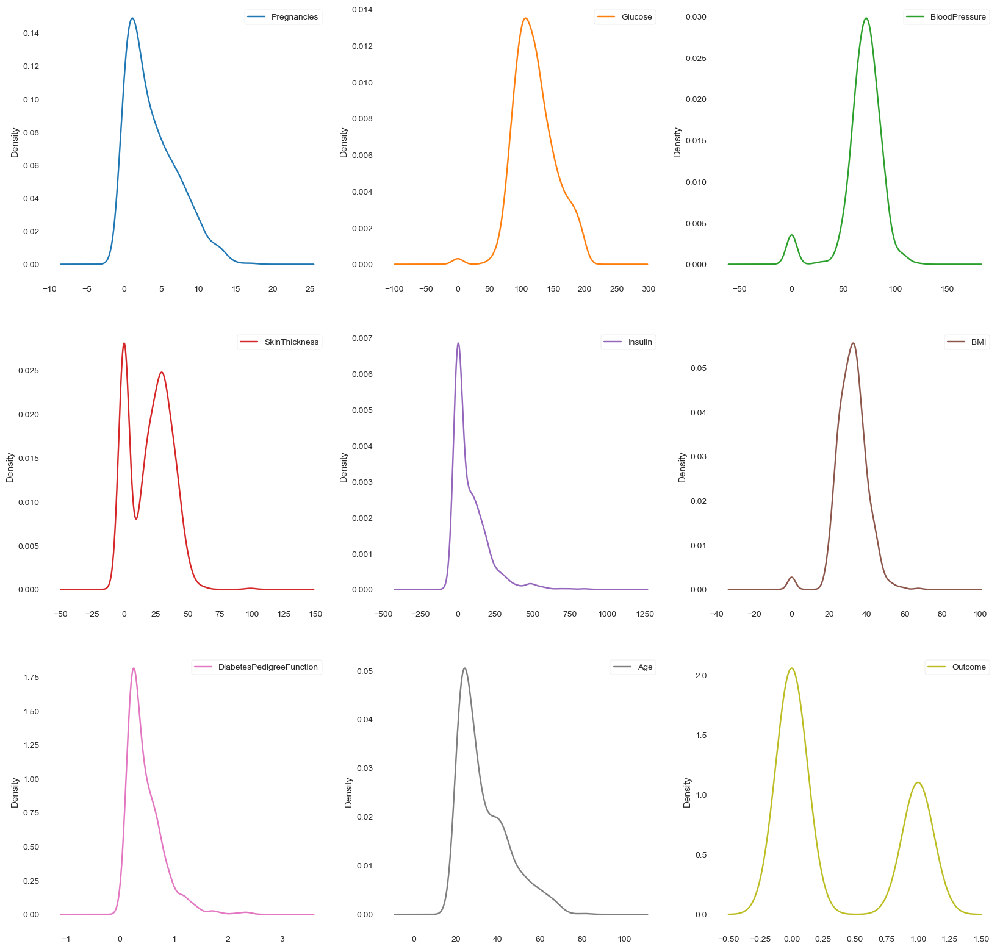

In [23]:
# Univariate Density Plots
data.plot(kind='density', subplots=True, layout=(3,3), sharex=False)

pyplot.show()

In [24]:
# Adjusting Plot Size
pyplot.rcParams['figure.figsize'] = [15, 15]

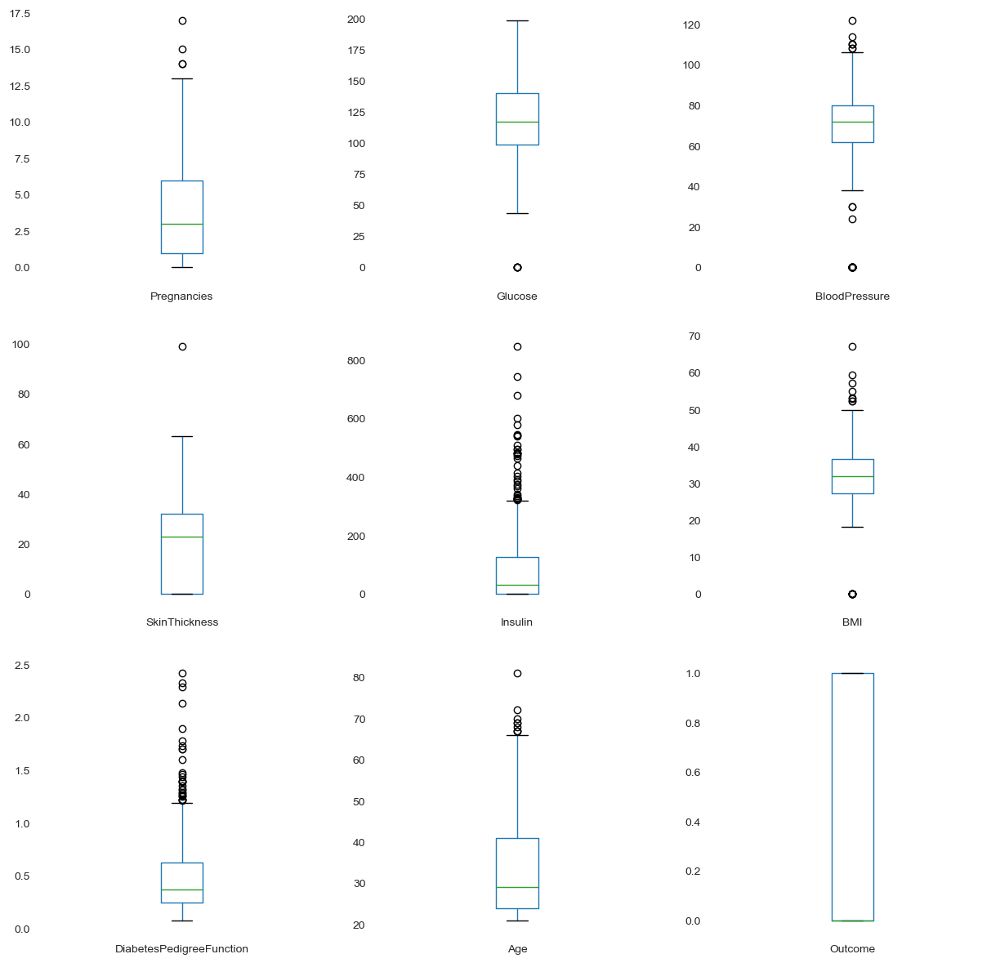

In [25]:
# Box and Whisker Plots
data.plot(kind='box', subplots=True, layout=(3,3), sharex=False, sharey=False)
pyplot.show()

In [26]:
# Adjusting Plot Size
pyplot.rcParams['figure.figsize'] = [15, 15]

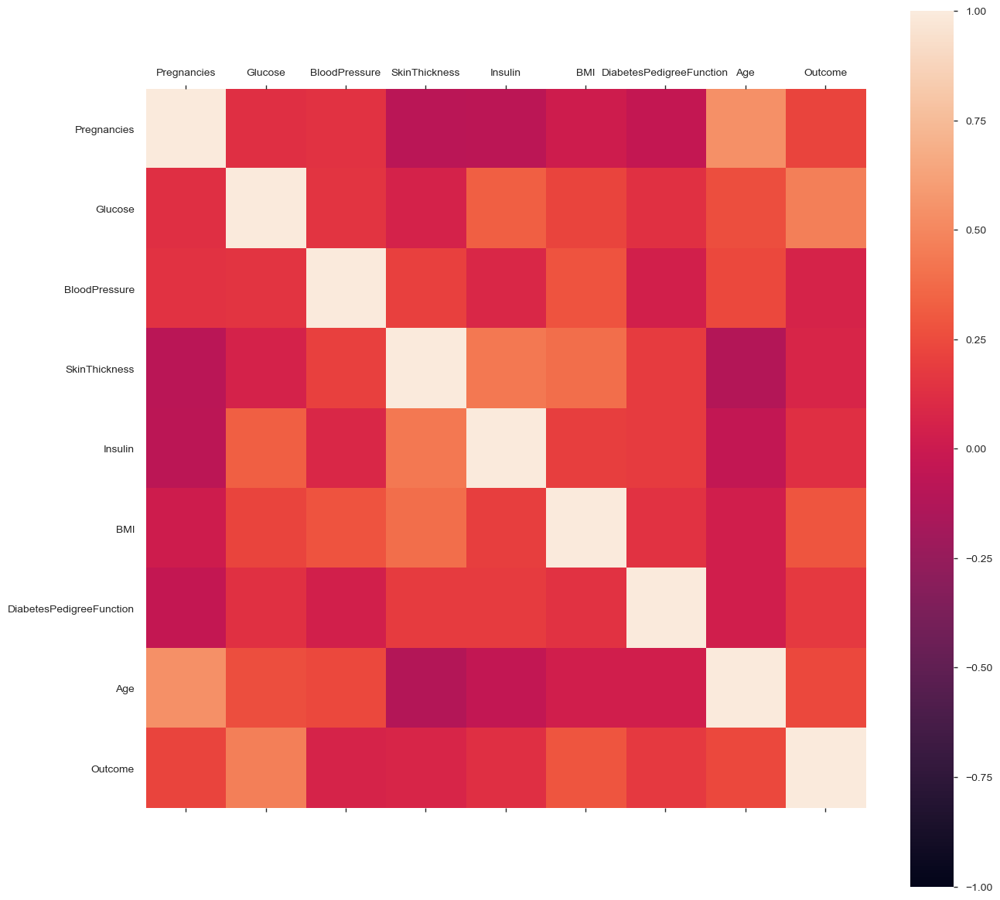

In [27]:
# Correction Matrix Plot
correlations = data.corr()
# plot correlation matrix
fig = pyplot.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = numpy.arange(0,9,1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(names)
ax.set_yticklabels(names)
pyplot.show()



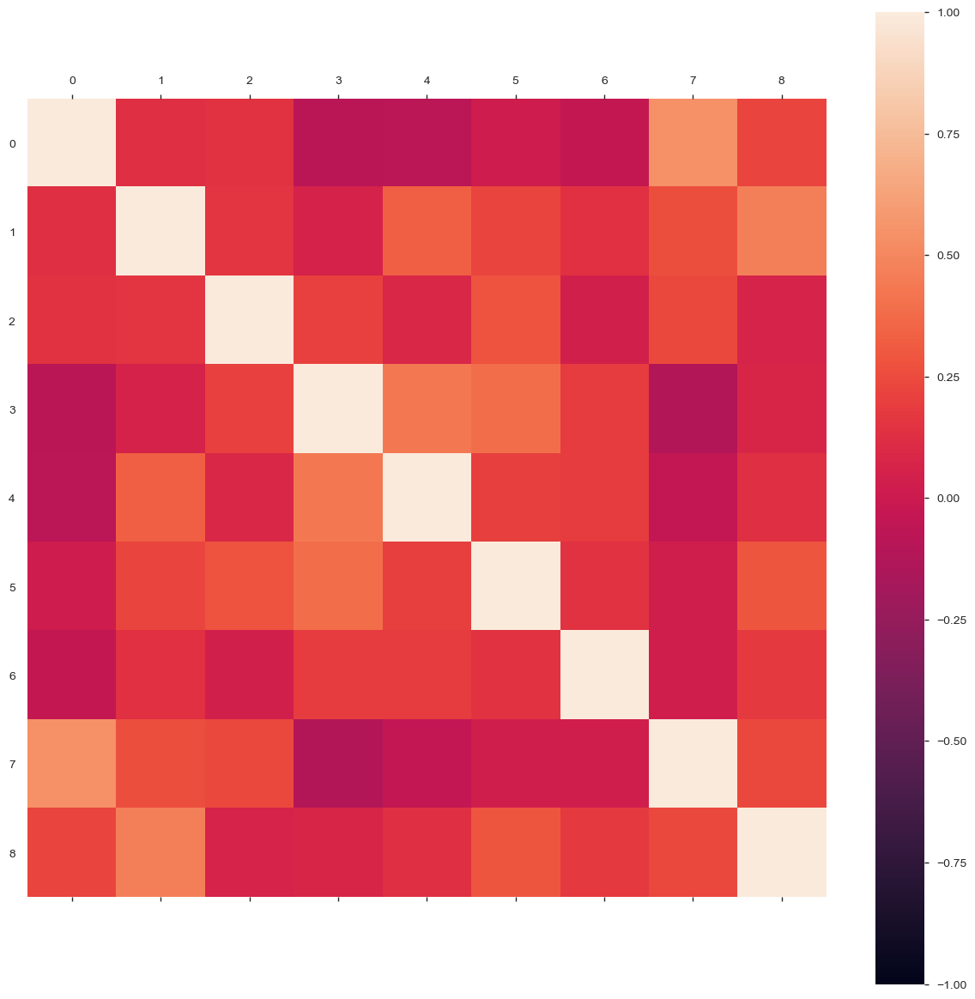

In [28]:
# Correction Matrix Plot (generic)
correlations = data.corr()
# plot correlation matrix
fig = pyplot.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
pyplot.show()

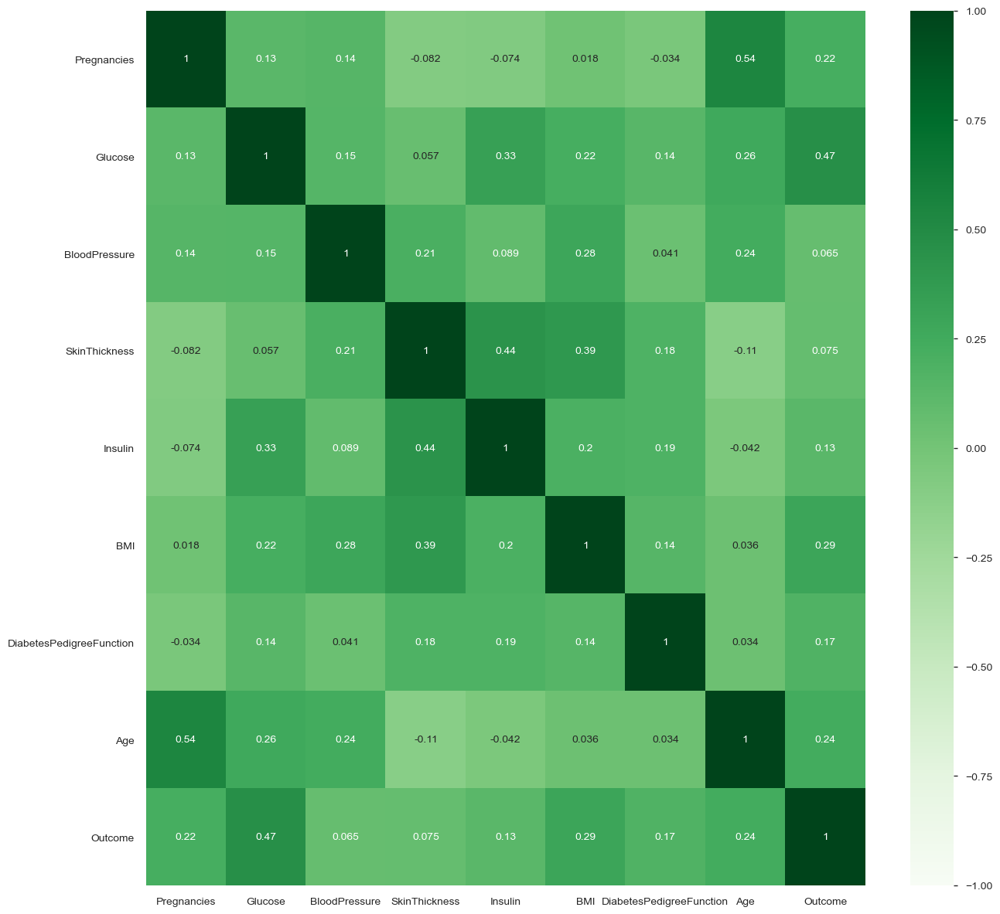

In [29]:
# Drawing Better Heatmap to know exact values
import seaborn as sns

heatmap = sns.heatmap(data.corr(), vmin=-1, vmax=1, annot=True,cmap="Greens")

In [46]:
# Adjusting Plot Size
pyplot.rcParams['figure.figsize'] = [20, 20]

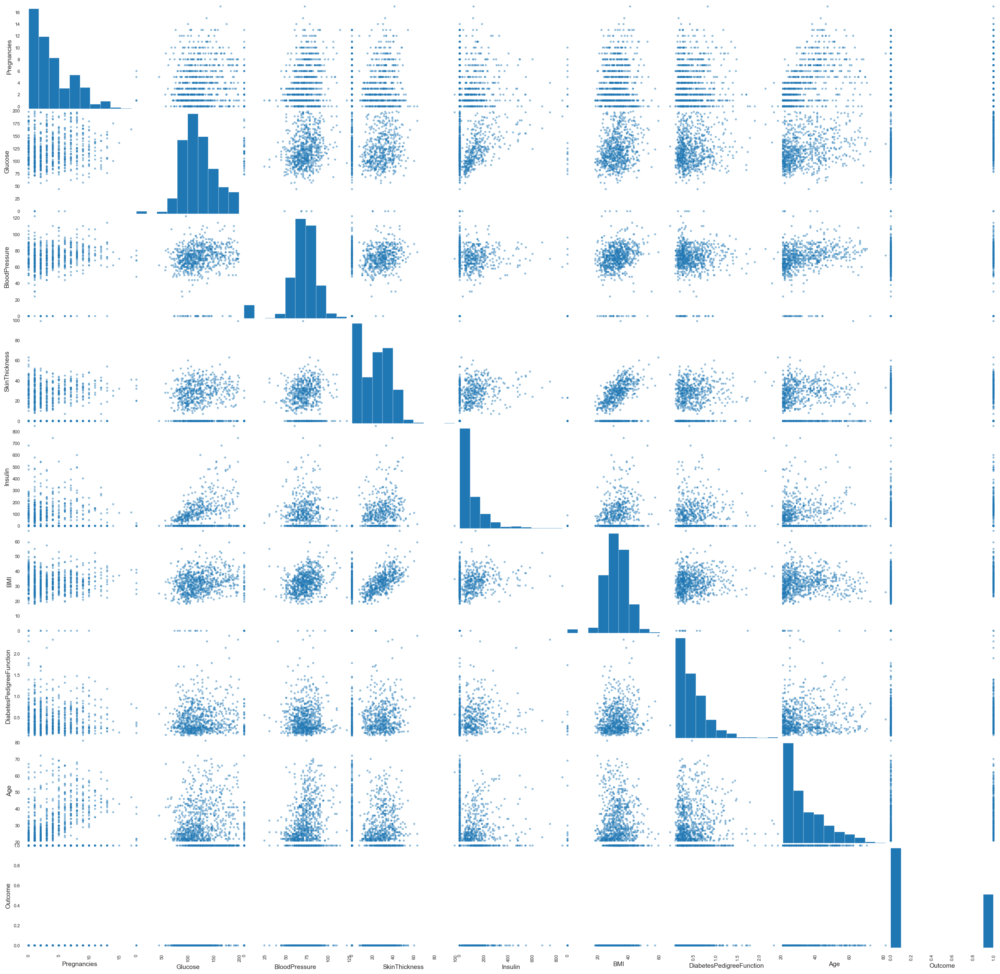

In [47]:
# Scatterplot Matrix
# Pleaes note that from pandas.tools.plotting import scatter_matrix will not work
from pandas.plotting import scatter_matrix


scatter_matrix(data)
pyplot.show()

Statistics=0.819, p=0.000


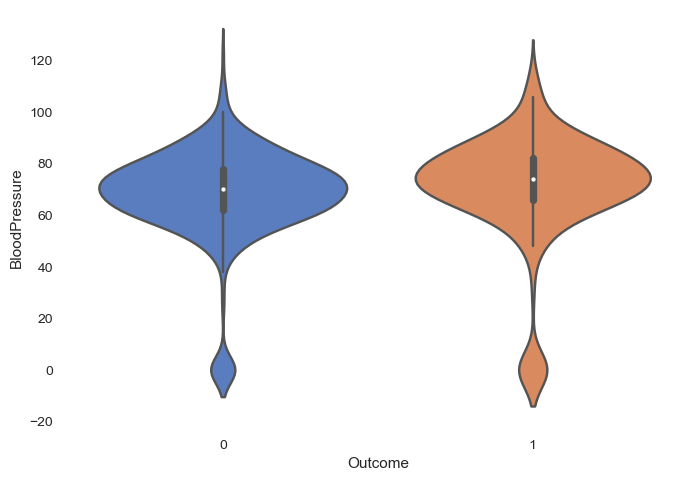

In [10]:
stat, p = shapiro(data['BloodPressure'])
print('Statistics=%.3f, p=%.3f' % (stat, p))
Statistics=0.819
p=0.000

#Classifying the Blood Pressure based on class
ax = sns.violinplot(x='Outcome', y='BloodPressure', data=data, palette='muted', split=True)

# Exercise
## 1.1. Change the size of plots properly and try to adjust each axis' label as much as you can to improve the visualization?
## 1.2. Can you interpret the data? From your perspective, which factors will be the most important to predict diabetes? Why? Please take two examples by adding one more mark down section below and explain it briefly (less than 100 words)
## 1.3. What other factors play role here? Why? Please another example by adding one more mark down section below and explain it briefly (less than 100 words)
## 1.4 Change the filename properly, and update the results (.ipynb) to the class github

1.2 From the better heat map I have drawn, we can see that the correlation coefficient between glucose level and outcome is the highest. In fact, from the other plots(box or density), the distribution of glucose in data suggests that even though there are few outliers, these results suggest that analyzing glucose levels can predict diabetes. Also, considering that diabetes is actually related to blood glucose levels, it can be said to be related.

1.3 Other examples with high correlation coefficients are pregnancy, BMI, and age. When analyzing statistical results, non-statistical knowledge should be actively utilized in order not to commit statistical errors such as selection bias. Considering the well-known medical fact that gestational diabetes, and the higher the BMI index and the higher the risk of adult disease as you get older, these factors are as important as the glucose level.